<center/><h1>The cost of basic goods</h1><center>
<h3>Taha Bouhoun<h3>

In [30]:
# Importing packages
import numpy as np
import pandas as pd
from math import*
from PIL import Image 
import matplotlib.pyplot as plt

%matplotlib inline

---

## Introduction
In this assignment, we model the cost of groceries in different neighborhoods of Berlin/London. Does the store brand affect product prices, or not? Are grocery prices and the geographical distribution of different grocery stores correlated with other cost-of-living measures in a city — for example, rent and real estate prices?

## I. Metadata:

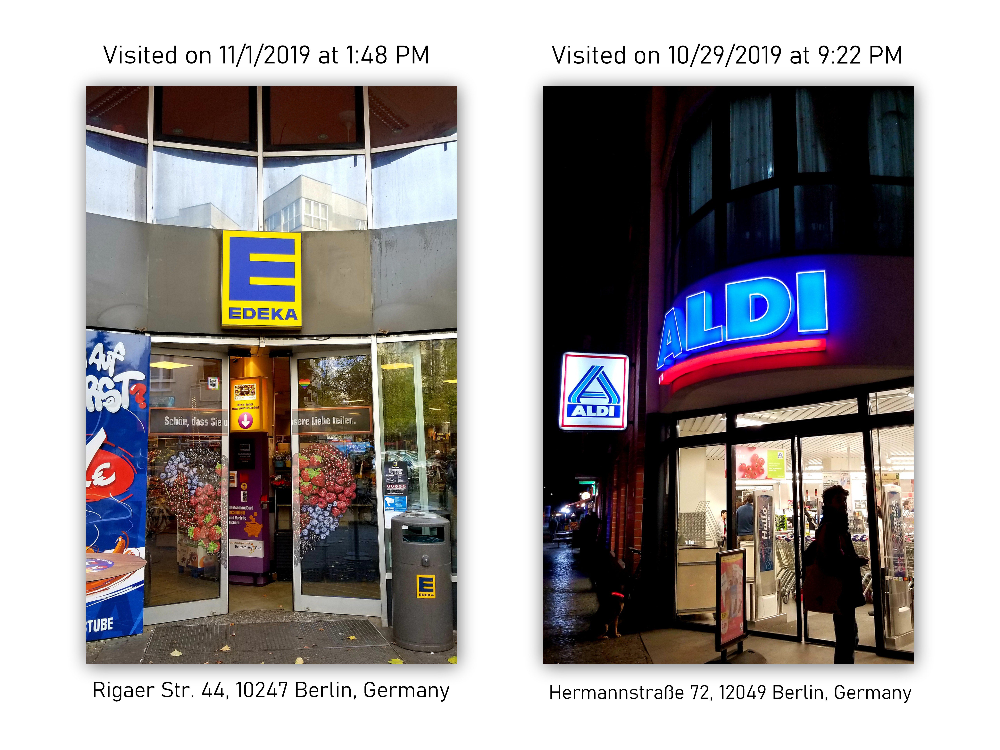

In [993]:
Image.open("CS146 LBA.jpg")

## Modifications on the csv file:
- Renamed the columns of each product to avoid replications. The columns are of the form <code>item_quantity_number</code> and <code>item_price_number</code>.
- Two observations had a URL in their addresses, since it wouldn't be compatible with the <code>geocoder</code> library, the URLs were deleted.
- Since the column of the prices in the dataset are set to be in Euros, I assumed that people from London, US, and Korea made the effort to convert their prices into Euros.

In [424]:
# IMPORTING THE DATA:

data = pd.read_csv('CS146 LBA Data.csv')
goods = ["Apples","Bananas","Tomatoes","Potatoes","Flour",
         "Rice","Milk","Butter","Eggs","Chicken"]

data = data.drop(['Timestamp','Email Address','Your name'], axis=1)
data.rename(columns={'Grocery store street address':'Location',
                   'Grocery store':'Store'}, inplace=True)

In [425]:
# CLEANING UP THE LOCATION ENTRIES:

import re
stores = ['ALDI','REWE','Lidl','EDEKA',
          'Tesco Express','Waitrose',"Sainsbury's"]
rep = re.compile('|'.join(map(re.escape, stores)))

for _ in range(len(data)):
    if data["Store"][_] in stores[:4] and \
    'Berlin' not in data["Location"][_]:
        data.at[_,"Location"] = data.at[_,"Location"] + ' Berlin'
        
        
    data.at[_, "Location"] = rep.sub('', data.at[_, "Location"])

In [426]:
# GEOCODING THE LOCATION OF THE STORES:
"""
Note: This cell takes approximately 45 sec to run and
requires Internet connectivity to generate the exact 
location for each store (Address, City, ZIP, Country)
"""
import geopy
from geopy.geocoders import Nominatim
geopy.geocoders.options.default_user_agent = "my-application"
nom = Nominatim(timeout=7)

postcode, district = [], []
for _ in range(len(data)):
    another = nom.geocode(data["Location"][_],addressdetails=True).raw
    data.at[_,"Location"] = another['display_name']
    postcode.append(another['address']['postcode'])
    if another['address']['country'] == 'Deutschland':
        try:
            district.append(another['address']['city_district'])
        except KeyError:
            district.append(another['address']['town'])
    elif another['address']['country'] == 'United Kingdom':
        district.append(another['address']['state_district'])
    else:
        district.append(another['address']['city'])

In [427]:
# COMPILE UNIQUE STORE NAMES:

for i in range(len(data["Store"])):
    if data["Store"][i] == 'Tesco':
        data.at[i,"Store"] = "Tesco Express"
    
    elif data["Store"][i] in ["Waitrose & Partners"
                              ,"Waitrose & Partners Islington"]:
        data.at[i,"Store"] = "Waitrose"
    
    elif data["Store"][i] in ["Sainsbury’s","SAINSBURY'S","Sainsbury"]:
        data.at[i,"Store"] = "Sainsbury's"


# ADJUST THE LAYOUT OF THE DATASET:
"""
The format of the dataset would allocate one row for each
observation by recording the item, quantity, store, district,
postcode, and location.
"""
dataset = []

for item in goods:
    for _, row in data.iterrows():
        for i in range(1, 4):
            if not isnan(row["{:s}_price_{:d}".format(item,i)]) \
            and not isnan(row["{:s}_quantity_{:d}".format(item,i)]):
                dataset.append([str(item),
                               row["{:s}_price_{:d}".format(item,i)]/\
                               row["{:s}_quantity_{:d}".format(item,i)], 
                               row['Store'], 
                               district[_],
                               postcode[_],
                               row['Location']])

dataset = pd.DataFrame(dataset, 
          columns=['Product','Price','Store',
                   'District','Postcode','Location'])

dataset.head(10)

,Product,Price,Store,District,Postcode,Location
0,Apples,2.5000,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,..."
1,Apples,1.8800,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,..."
2,Apples,3.1500,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,..."
3,Apples,2.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk..."
4,Apples,1.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk..."
5,Apples,2.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk..."
6,Apples,2.9900,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll..."
7,Apples,1.7900,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll..."
8,Apples,2.3625,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll..."
9,Apples,1.7900,Lidl,Mitte,10117,"Lidl, 42, Leipziger Straße, Spandauer Vorstadt..."


In [428]:
print(dataset.Store.unique(),'\n')
print(dataset.District.unique())

['ALDI' 'REWE' 'Lidl' 'Tesco Express' 'EDEKA' 'Waitrose' 'Safeway'
 'Lotte Mart' "Sainsbury's"] 

['Lichtenberg' 'Neukölln' 'Mitte' 'Friedrichshain-Kreuzberg'
 'Greater London' 'San Francisco' 'Mountain View' 'Palo Alto' 'Pankow'
 '서울' 'Treptow-Köpenick' 'Nordstadt' 'Tempelhof-Schöneberg'
 'Charlottenburg-Wilmersdorf']


In [429]:
dataset.Store = pd.Categorical(dataset.Store)
dataset.District = pd.Categorical(dataset.District)
dataset.Product = pd.Categorical(dataset.Product)

dataset['store_code'] = dataset.Store.cat.codes
dataset['district_code'] = dataset.District.cat.codes
dataset['product_code'] = dataset.Product.cat.codes

In [430]:
dataset['store_code'] = pd.factorize(dataset['store_code'], sort=True)[0] + 1 
dataset['district_code'] = pd.factorize(dataset['district_code'], sort=True)[0] + 1 
dataset['product_code'] = pd.factorize(dataset['product_code'], sort=True)[0] + 1 

dataset.head(10)

,Product,Price,Store,District,Postcode,Location,store_code,district_code,product_code
0,Apples,2.5000,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
1,Apples,1.8800,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
2,Apples,3.1500,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
3,Apples,2.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",5,7,1
4,Apples,1.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",5,7,1
5,Apples,2.4900,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",5,7,1
6,Apples,2.9900,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll...",1,7,1
7,Apples,1.7900,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll...",1,7,1
8,Apples,2.3625,ALDI,Neukölln,12049,"Aldi, 72, Hermannstraße, Schillerkiez, Neuköll...",1,7,1
9,Apples,1.7900,Lidl,Mitte,10117,"Lidl, 42, Leipziger Straße, Spandauer Vorstadt...",3,5,1


In [431]:
# DESRCIPTIVE STATISTICS:
"""
This section is meant to highlight the mean and variance
of the price for each product. The aim is to single out
extereme outliers that might hinder the accuracy of our
inference.
"""

means, var = [], []
for item in dataset.Product.unique():
    # simple mean price for each product
    means.append("{:.3f}".format(dataset[\
        dataset.Product == item].Price.mean()))
    
    # variance of prices for each product
    var.append("{:.3f}".format(dataset[\
        dataset.Product == item].Price.var()))

# formating the statistics into a table
fig = go.Figure(data=[go.Table(header=dict(
      values=['Product','Mean price', 'Variance']),
      cells=dict(values=[list(\
      dataset.Product.unique()), means, var]))])

fig.show()

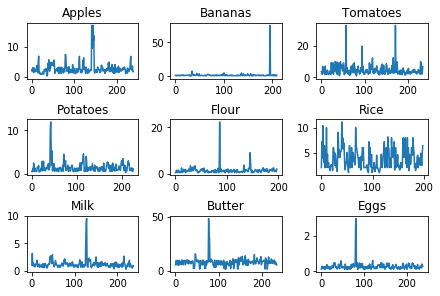

In [432]:
# SHOWING THE OUTLIERS:
"""
Exmple of outliers:
- an entry for Bananas at 75$ for 1 kg
- an entry for Flour at 22$ for 1 kg
- two entries for Apples for over 15$ per kg

These observations are plausibly linked to 
measurment errors might bias the model's results.
Code inspired from: https://stackoverflow.com/questions/31726643/
"""
def plot(ax, i):
    ax.plot(np.array(dataset[dataset.Product == goods[i]].Price))
    ax.set_title(goods[i])

fig, axs = plt.subplots(nrows=3, ncols=3, constrained_layout=True)
i = 0
for ax in axs.flat:
    plot(ax, i)
    i += 1

- **Remark on the outliers:**
Although some of the outliers are most likely due to error, I chose not to drop those observations as I'm not completely confident about their validity. In addition, dropping observations can be a subjective process since I can't bias the analysis but setting an arbitrary limit of what I deem to be a real observation or a measurment error.

In [433]:
# DISPLAY THE NUMBER OF OBSERVATIONS FROM EACH STORE:

import plotly.graph_objects as go
stores = dataset.Store.unique()
locations, observations = [], []
for _ in stores:
    locations.append(
        len(dataset.loc[dataset['Store'] == _].Location.unique()))
    observations.append(
        len(dataset.loc[dataset['Store'] == _]))

fig = go.Figure(data=[go.Table(header=dict(
                values=['Store','Locations','Observations']),
                cells=dict(values=[stores, 
                                   locations,
                                   observations]))])
fig.show()

## II. Model

<code>Stan_code</code>: The Stan model is a simulation that uses Markov Chains and Monte Carlo to sample the posterior over the base price of each product and the multiplier associated with each store and each location.

- **The base price:** follows a cauchy distribution since we don't have much knowledge about their estimates.

- **The store & location multiplier:** both multipliers follow a log normal distribution since it has to be homogenous with the price and can take advantage of the multiplicative nature of log normal.

<code>Price_distribution</code>: 
The price has a normal distribution with a mean that is expressed by the formula that construct the price
$$price\sim Normal\left(base\cdot location\cdot store,\ error\right)$$
The error in this distribution follows an Inverse Gamma distribution with parameters (1, 1)

In [434]:
import pystan
import scipy.stats as sts

# STAN MODEL

stan_code = """

data {
    int<lower=0> n;
    real<lower=0> price[n];
    
    int<lower=0> p;
    int<lower=1> product[n];
    
    int<lower=0> s;
    int<lower=1> store[n];
    
    int<lower=0> l;
    int<lower=1> location[n];
}

parameters {
    real<lower=0> sigma;
    
    real<lower=0> base_price[p];
    real<lower=0> s_multiplier[s];
    real<lower=0> l_multiplier[l];
}

model {

    base_price ~ cauchy(0, 10);
    sigma ~ inv_gamma(1, 1); 
    
    s_multiplier ~ lognormal(0, .5);
    l_multiplier ~ lognormal(0, .5);
    
    for(i in 1:n) {
        price[i] ~ normal(base_price[product[i]] 
        * (s_multiplier[store[i]]) 
        * (l_multiplier[location[i]]), sigma);}
        
}
"""

In [435]:
stan_model = pystan.StanModel(model_code= stan_code)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_bd794469b5153e78a2a3c062dcdb0e2f NOW.


In [437]:
# FEEDING THE DATASET INTO STAN SIMULATION
# Code from CS146 session 7.2 on 2016 US Elections

stan_data = {
    'n':len(dataset),
    'price':dataset["Price"].values,
    
    'p':len(dataset["Product"].unique()),
    'product': np.array(dataset.product_code),
    
    's':len(dataset["Store"].unique()),
    'store': np.array(dataset.store_code),
    
    'l':len(dataset["District"].unique()),
    'location': np.array(dataset.district_code)
    }

In [536]:
results = stan_model.sampling(data=stan_data)

## III. Results

In [439]:
print(results)

Inference for Stan model: anon_model_bd794469b5153e78a2a3c062dcdb0e2f.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                   mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
sigma              2.93  7.3e-4   0.04   2.84    2.9   2.93   2.96   3.02   3608    1.0
base_price[1]      4.19    0.02   0.85   2.73   3.59   4.13    4.7   6.04   1335    1.0
base_price[2]      3.01    0.02   0.65    1.9   2.55   2.94   3.41   4.43   1469    1.0
base_price[3]     12.12    0.07   2.34   7.98  10.49  11.92  13.54  17.33   1211    1.0
base_price[4]     13.72    0.08   2.64   9.06  11.85   13.5  15.32  19.68   1225    1.0
base_price[5]      0.45  5.0e-3   0.26   0.05   0.26   0.42   0.61   1.03   2632    1.0
base_price[6]      1.83    0.01   0.46   1.06   1.51   1.78    2.1   2.85   1642    1.0
base_price[7]      1.67 10.0e-3   0.41   0.95   1.38   1.63   1.92   2.56   1712    1.0
base_price[8]      


95% CI for the error: [2.84474749 3.01529379] 
Mean: 2.9276


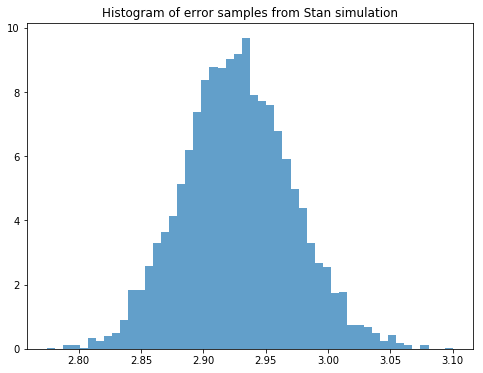

In [470]:
sigma_samples = results.extract()['sigma']
print("\n95% CI for the error:",
     np.percentile(sigma_samples, [2.5, 97.5]),
     "\nMean:", '{:.4f}'.format(np.mean(sigma_samples)))

plt.figure(figsize=(8, 6))
plt.hist(sigma_samples, bins=50, density=True, alpha=0.7)
plt.title("Histogram of error samples from Stan simulation")
plt.show()

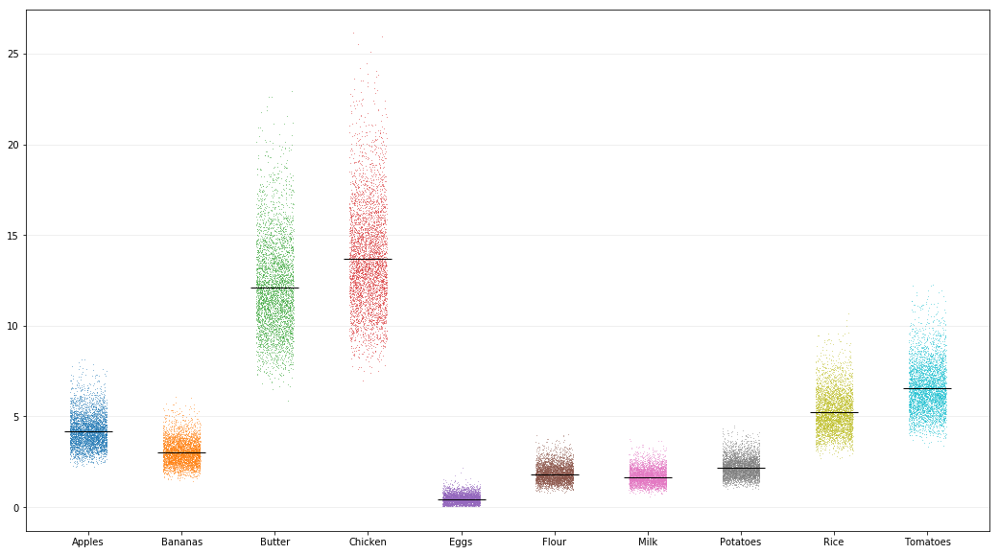

In [537]:
samples = results.extract()


# Code inspired from CS146 session 7.2 on 2016 US Elections
plt.figure(figsize=(18,10))
for i in range(len(dataset.Product.unique())):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['base_price'][:,i], ',', alpha=0.5)
    
    
plt.plot(range(1, len(dataset.Product.unique())+1),
         samples['base_price'].mean(axis=0), 
         marker='_',linewidth=0,color="black",alpha=1,markersize=50)

plt.xticks(range(1, len(dataset.Product.unique())+1), 
           sorted(list(dataset.Product.unique())))
plt.grid(True, alpha=0.25, axis='y')
plt.show()

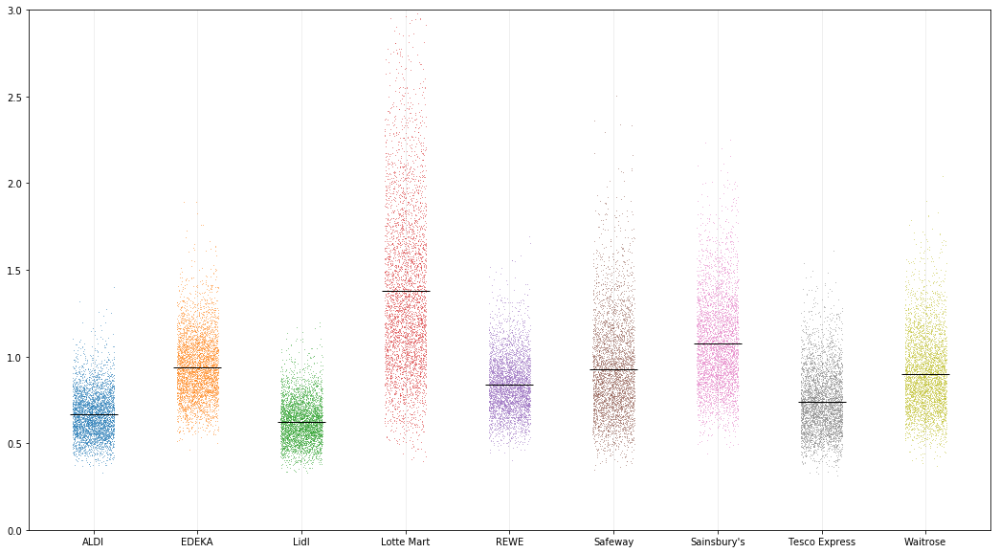

In [465]:
plt.figure(figsize=(18, 10))
for i in range(len(dataset.Store.unique())):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
             samples['s_multiplier'][:,i], ',', alpha=0.5)


plt.plot(range(1, len(dataset.Store.unique())+1),
         samples['s_multiplier'].mean(axis=0), 
         marker='_',linewidth=0,color="black",alpha=1,markersize=50)

plt.xticks(range(1,len(dataset.Store.unique())+1), 
           sorted(list(dataset.Store.unique())))
plt.grid(True, alpha=0.25, axis='x')
plt.ylim(0, 3)
plt.show()

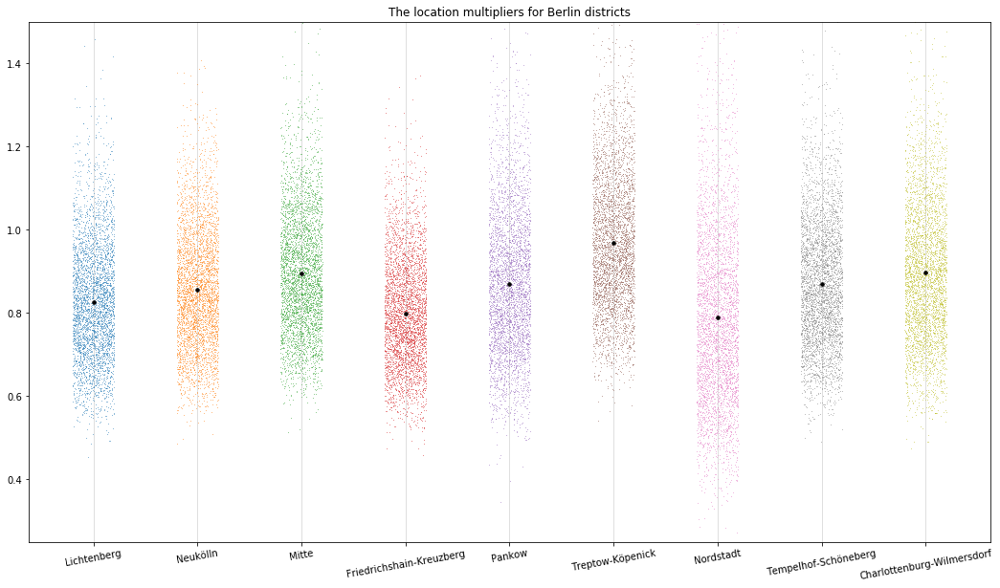

In [469]:
# LOCATION FOR BERLIN

Berlin_code = [4,7,5,2,10,13,8,12,1] # BERLIN
Berlin_regions = ['Lichtenberg','Neukölln','Mitte',
                  'Friedrichshain-Kreuzberg','Pankow',
                  'Treptow-Köpenick','Nordstadt',
                  'Tempelhof-Schöneberg','Charlottenburg-Wilmersdorf']

plt.figure(figsize=(18, 10))
for i in range(len(Berlin_code)):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
                samples['l_multiplier'][:,Berlin_code[i]-1],',', alpha=0.5)

plt.plot(range(1, len(Berlin_regions)+1),
         [samples['l_multiplier'][:,Berlin_code[i]-1]. \
         mean(axis=0) for i in range(len(Berlin_regions))], 
         marker='.',linewidth=0,color="black",alpha=1,markersize=7)

plt.xticks(range(1,len(Berlin_regions)+1), Berlin_regions, rotation=10)
plt.title("The location multipliers for Berlin districts")
plt.grid(True, alpha=0.5, axis='x')
plt.ylim(0.25, 1.5)
plt.show()

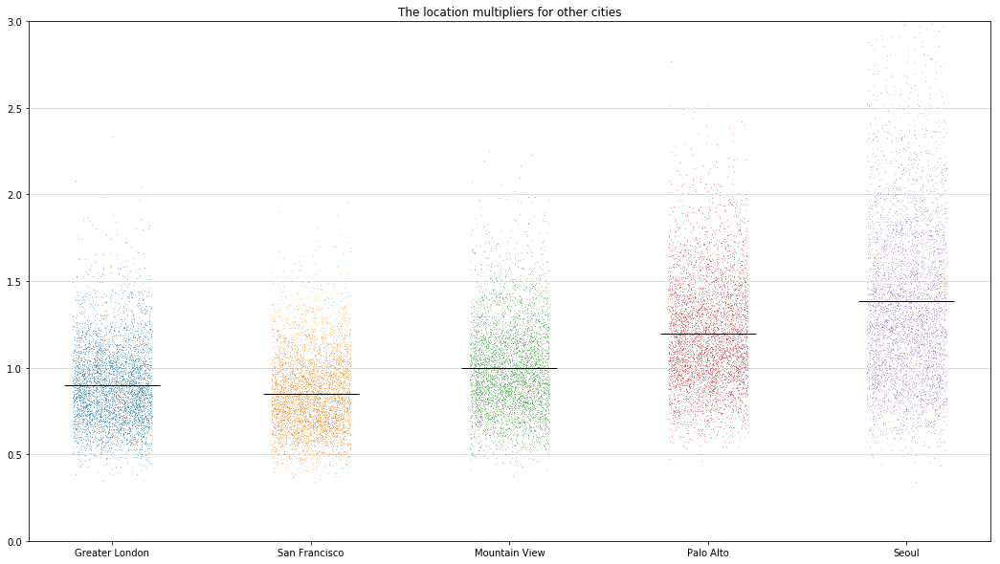

In [455]:
# FOR OTHER CITIES

Other_code = [3,11,6,9,14] # Other cities
Other_cities = ['Greater London','San Francisco',
                'Mountain View','Palo Alto','Seoul']


plt.figure(figsize=(18, 10))

for i in range(len(Other_code)):
    plt.plot(sts.uniform.rvs(loc=i+1-0.2, scale=0.4, size=4000), 
                samples['l_multiplier'][:,Other_code[i]-1],',', alpha=0.5)


plt.plot(range(1, len(Other_cities)+1),
         [samples['l_multiplier'][:,Other_code[i]-1]. \
         mean(axis=0) for i in range(len(Other_cities))], 
         marker='_',linewidth=0,color="black",alpha=1,markersize=100)

plt.xticks(range(1,len(Other_cities)+1), Other_cities)
plt.grid(True, alpha=0.5, axis='y')
plt.ylim(0, 3)
plt.title("The location multipliers for other cities")
plt.show()

### Correlation of rent prices with location multipliers

The correlation coefficient between rent prices and location multipliers: 0.517982094485114


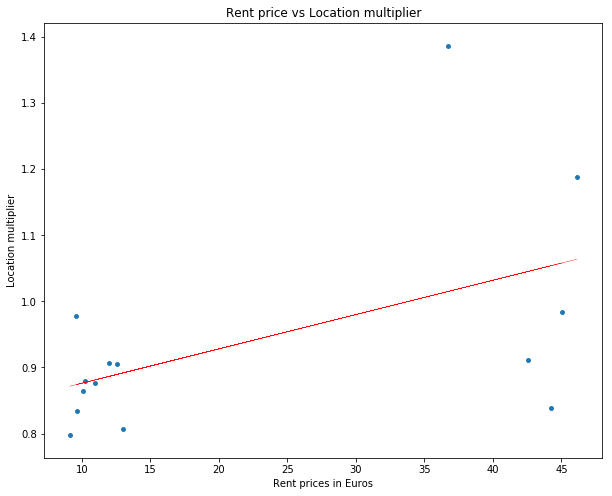

In [554]:
# PART I: Using district categorization.
"""
The values are expressed in Euros and represent
the average price of rent for each disitrict/city
per sqaure meter per month.
"""
Locations = sorted(list(dataset.District.unique()))
Multipliers = [samples['l_multiplier'][:,_].\
               mean() for _ in range(len(Locations))]
Rent_costs = [12, 12.99, 42.56, 9.64, 12.59, 45.05, 10.09, 
              9.11, 46.12, 10.97, 44.23, 10.26, 9.61, 36.73]


print('The correlation coefficient between \
rent prices and location multipliers:'
,"{0:.3%}".format(np.corrcoef(Rent_costs, Multipliers)[0][1]))

plt.figure(figsize=(10, 8))
plt.scatter(Rent_costs, Multipliers, s=15)
plt.plot(Rent_costs, np.poly1d(np.polyfit\
        (Rent_costs, Multipliers, 1))(Rent_costs), 
         color='r', linewidth=.2)

plt.ylabel("Location multiplier")
plt.xlabel("Rent prices in Euros")
plt.title("Rent price vs Location multiplier")
plt.show()

In [555]:
# PART II: Using zip code categorization for Berlin

"""
Data for the rent price average for each postcode
is extracted from the Housing Market Report Berlin 2019
Unit of prices: Euros/m^2/month
"""

rent_berlin = pd.read_csv('Rent_prices_Berlin.csv')
berlin_data = dataset[dataset['Store'].\
                isin(['ALDI','REWE','Lidl','EDEKA'])]
berlin_rent_zip = rent_berlin[rent_berlin.Postcode. \
                isin(berlin_data.Postcode.unique())]
berlin_data.head()

,Product,Price,Store,District,Postcode,Location,store_code,district_code,product_code
0,Apples,2.50,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
1,Apples,1.88,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
2,Apples,3.15,ALDI,Lichtenberg,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,4,1
3,Apples,2.49,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",5,7,1
4,Apples,1.49,REWE,Neukölln,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",5,7,1


In [556]:
berlin_data = berlin_data.drop(['store_code','district_code','product_code'],axis=1)

berlin_data.Store = pd.Categorical(berlin_data.Store)
berlin_data.District = pd.Categorical(berlin_data.Postcode)
berlin_data.Product = pd.Categorical(berlin_data.Product)

berlin_data['store_code'] = berlin_data.Store.cat.codes
berlin_data['post_code'] = berlin_data.Postcode.cat.codes
berlin_data['product_code'] = berlin_data.Product.cat.codes

berlin_data['store_code'] = pd.factorize(berlin_data['store_code'], sort=True)[0] + 1 
berlin_data['post_code'] = pd.factorize(berlin_data['post_code'], sort=True)[0] + 1 
berlin_data['product_code'] = pd.factorize(berlin_data['product_code'], sort=True)[0] + 1 

berlin_data.head()

,Product,Price,Store,District,Postcode,Location,store_code,post_code,product_code
0,Apples,2.50,ALDI,10319,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,9,1
1,Apples,1.88,ALDI,10319,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,9,1
2,Apples,3.15,ALDI,10319,10319,"Aldi, 98, Rummelsburger Straße, Sewan-Viertel,...",1,9,1
3,Apples,2.49,REWE,12043,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",4,24,1
4,Apples,1.49,REWE,12043,12043,"Aldi, 92-98, Karl-Marx-Straße, Donaukiez, Neuk...",4,24,1


In [557]:
stan_berlin_data = {
    'n':len(berlin_data),
    'price':berlin_data["Price"].values,
    
    'p':len(berlin_data["Product"].unique()),
    'product': np.array(berlin_data.product_code),
    
    's':len(berlin_data["Store"].unique()),
    'store': np.array(berlin_data.store_code),
    
    'l':len(berlin_data.post_code.unique()),
    'location': np.array(berlin_data.post_code)
    }

In [558]:
results = stan_model.sampling(data=stan_berlin_data)

In [559]:
print(results)

Inference for Stan model: anon_model_bd794469b5153e78a2a3c062dcdb0e2f.
4 chains, each with iter=2000; warmup=1000; thin=1; 
post-warmup draws per chain=1000, total post-warmup draws=4000.

                   mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
sigma              2.31  7.9e-4   0.04   2.23   2.28   2.31   2.34    2.4   2964    1.0
base_price[1]      3.33    0.03   0.79   1.99   2.79   3.25   3.76   5.11    642    1.0
base_price[2]      2.38    0.02   0.61   1.37   1.95   2.31   2.71    3.8    695    1.0
base_price[3]     10.89     0.1   2.45   6.74   9.25  10.62  12.24   16.6    589    1.0
base_price[4]      13.9    0.13   3.12   8.62  11.78  13.58  15.62  21.13    588   1.01
base_price[5]      0.44  6.3e-3   0.26   0.04   0.26   0.41    0.6   1.02   1665    1.0
base_price[6]      1.77    0.02   0.48   0.98   1.43   1.72   2.06   2.88    795    1.0
base_price[7]      1.76    0.02   0.48   0.97   1.42    1.7   2.03    2.8    789    1.0
base_price[8]      

The correlation coefficient between rent prices and location multipliers: 0.769%


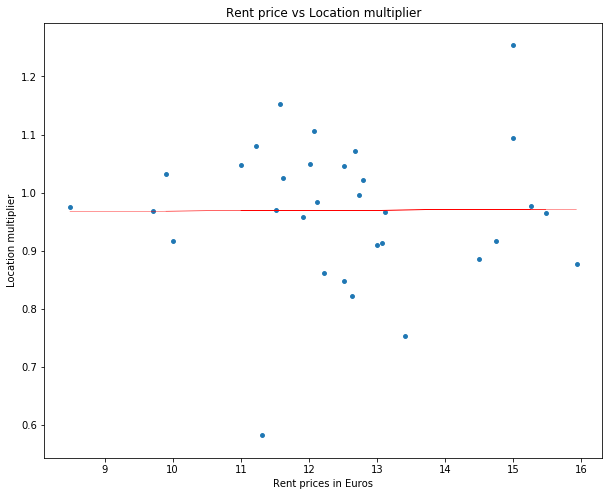

In [563]:
berlin_rent_zip = berlin_rent_zip.\
                  sort_values(by=['Postcode'])
samples = results.extract()

Multipliers = [samples['l_multiplier'][:,_].\
               mean() for _ in range(32)]

Rent_costs = berlin_rent_zip.Basic_rent

print('The correlation coefficient between \
rent prices and location multipliers:'
,"{0:.3%}".format(np.corrcoef(Rent_costs, Multipliers)[0][1]))


plt.figure(figsize=(10, 8))
plt.scatter(Rent_costs, Multipliers, s=15)
plt.plot(Rent_costs, np.poly1d(np.polyfit\
        (Rent_costs, Multipliers, 1))(Rent_costs), 
         color='r', linewidth=.2)
plt.ylabel("Location multiplier")
plt.xlabel("Rent prices in Euros")
plt.title("Rent price vs Location multiplier")
plt.show()

## VI. Stretch goal

## V. References
- Bergmann G., Baumunk H. (2019). Housing Market Report Berlin 2019. BERLIN HYP & CBRE. Retrieved from: https://www.berlinhyp.de/bhyp/en/medias/sys_master/pdf/h68/hd1/8812673892382.pdf
- Gelman, Andrew, Jennifer Hill., (2007). Data Analysis Using Regression and Multilevel-Hierarchical Models. Cambridge, United Kingdom: Cambridge University Press. Retrieved from: https://mc-stan.org/docs/2_18/stan-users-guide/multivariate-hierarchical-priors-section.html?fbclid=IwAR1FBN_D0w-BLQGDGOR4hRCq_dBXn4RHclMbO-seeI9AQAZQ-kH6QKr0_4c

## VI. Appendix

- #correlation: After gathering the rent prices for each district, the analysis covers the correlation between the location multipliers of those regions and the average rent price of that region. The correlation analysis is also done to rent prices in each postal code in Berlin that we gathered observations from.

- #descriptivestats: After cleaning the intial dataset, the analysis covered descriptive stats such as mean and variance in order to get a sense of the dataset details and single out outliers.

- #samling: The posteriors for base price, location multiplier, and store multiplier are sampled from the Stan simulation, the results then are plotted to highlight their mean and their variance for each of the products, locations, and stores.